In [1]:
!nvidia-smi

Sat Apr 29 13:19:43 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   49C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Stable Diffusion - Hugging Face Understanding

In [3]:
!pip install -q --upgrade transformers diffusers ftfy
!pip install -q accelerate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 72.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 934.9/934.9 kB 65.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 110.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 31.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 215.3/215.3 kB 20.3 MB/s eta 0:00:00


In [6]:
from base64 import b64encode

import numpy
import torch
from diffusers import AutoencoderKL, LMSDiscreteScheduler, UNet2DConditionModel
from huggingface_hub import notebook_login
import torch.nn as nn
import torch.nn.functional as F
import random
from tqdm import tqdm
import os

# For video display:
from IPython.display import HTML
from matplotlib import pyplot as plt
from pathlib import Path
from PIL import Image
from torch import autocast
from torchvision import transforms as tfms
from tqdm.auto import tqdm
from transformers import CLIPTextModel, CLIPTokenizer, logging

torch.manual_seed(1)
if not (Path.home()/'.huggingface'/'token').exists(): notebook_login()

# Supress some unnecessary warnings when loading the CLIPTextModel
logging.set_verbosity_error()

# Set device
torch_device = "cuda" if torch.cuda.is_available() else "cpu"

In [5]:
# Load the autoencoder model which will be used to decode the latents into image space. 
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")

# Load the tokenizer and text encoder to tokenize and encode the text. 
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")

# The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet")

# The noise scheduler
scheduler = LMSDiscreteScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000)

# To the GPU we go!
vae = vae.to(torch_device)
text_encoder = text_encoder.to(torch_device)
unet = unet.to(torch_device);

<ipython-input-6-801350264909>:27: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (batch_size, unet.in_channels, height // 8, width // 8),


0it [00:00, ?it/s]

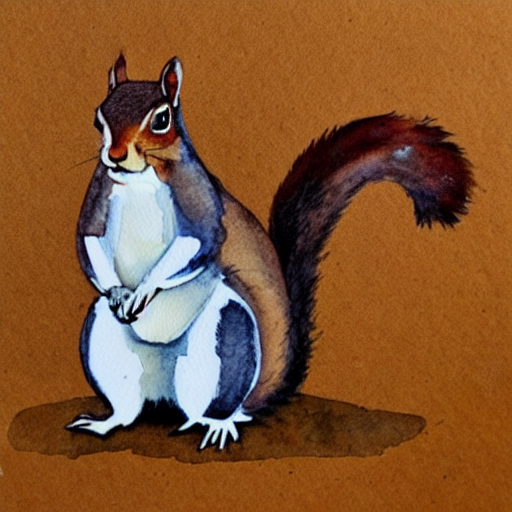

In [ ]:
# Some settings
prompt = ["A watercolor painting of a squirrel"]
height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion
num_inference_steps = 30            # Number of denoising steps
guidance_scale = 7.5                # Scale for classifier-free guidance
generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise
batch_size = 1

# Prep text 
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
with torch.no_grad():
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0] 
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

# Prep Scheduler
scheduler.set_timesteps(num_inference_steps)

# Prep latents
latents = torch.randn(
  (batch_size, unet.in_channels, height // 8, width // 8),
  generator=generator,
)
latents = latents.to(torch_device)
latents = latents * scheduler.init_noise_sigma # Scaling (previous versions did latents = latents * self.scheduler.sigmas[0]

# Loop
with autocast("cuda"):
    for i, t in tqdm(enumerate(scheduler.timesteps)):
        # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
        latent_model_input = torch.cat([latents] * 2)
        sigma = scheduler.sigmas[i]
        # Scale the latents (preconditioning):
        # latent_model_input = latent_model_input / ((sigma**2 + 1) ** 0.5) # Diffusers 0.3 and below
        latent_model_input = scheduler.scale_model_input(latent_model_input, t)

        # predict the noise residual
        with torch.no_grad():
            noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

        # perform guidance
        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        # compute the previous noisy sample x_t -> x_t-1
        # latents = scheduler.step(noise_pred, i, latents)["prev_sample"] # Diffusers 0.3 and below
        latents = scheduler.step(noise_pred, t, latents).prev_sample

# scale and decode the image latents with vae
latents = 1 / 0.18215 * latents
with torch.no_grad():
    image = vae.decode(latents).sample

# Display
image = (image / 2 + 0.5).clamp(0, 1)
image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
images = (image * 255).round().astype("uint8")
pil_images = [Image.fromarray(image) for image in images]
pil_images[0]

##AE

In [ ]:
def pil_to_latent(input_im):
    # Single image -> single latent in a batch (so size 1, 4, 64, 64)
    with torch.no_grad():
        latent = vae.encode(tfms.ToTensor()(input_im).unsqueeze(0).to(torch_device)*2-1) # Note scaling
    return 0.18215 * latent.latent_dist.sample()  # [1, 4, 64, 64]

def latents_to_pil(latents):
    # bath of latents -> list of images
    latents = (1 / 0.18215) * latents
    with torch.no_grad():
        image = vae.decode(latents).sample
    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (image * 255).round().astype("uint8")
    pil_images = [Image.fromarray(image) for image in images]
    return pil_images

In [ ]:
# Download a demo Image
!curl --output macaw.jpg 'https://lafeber.com/pet-birds/wp-content/uploads/2018/06/Scarlet-Macaw-2.jpg'

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 62145  100 62145    0     0  92203      0 --:--:-- --:--:-- --:--:-- 92203


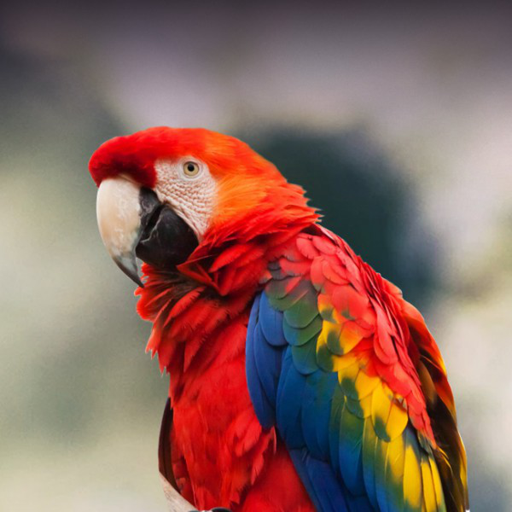

In [ ]:
# Load the image with PIL
input_image = Image.open('macaw.jpg').resize((512, 512))
input_image

In [ ]:
# Encode to the latent space
encoded = pil_to_latent(input_image)
encoded.shape

torch.Size([1, 4, 64, 64])

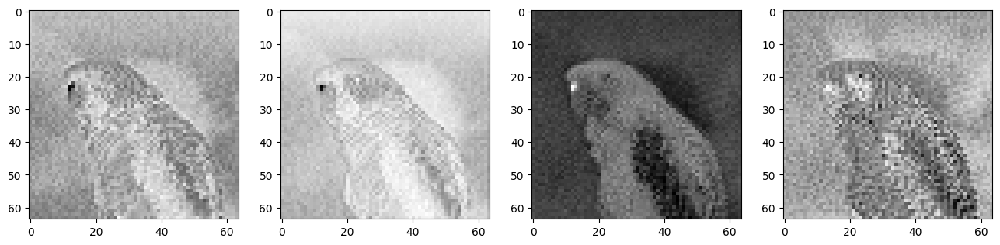

In [ ]:
# Let's visualize the four channels of this latent representation:
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
for c in range(4):
    axs[c].imshow(encoded[0][c].cpu(), cmap='Greys')

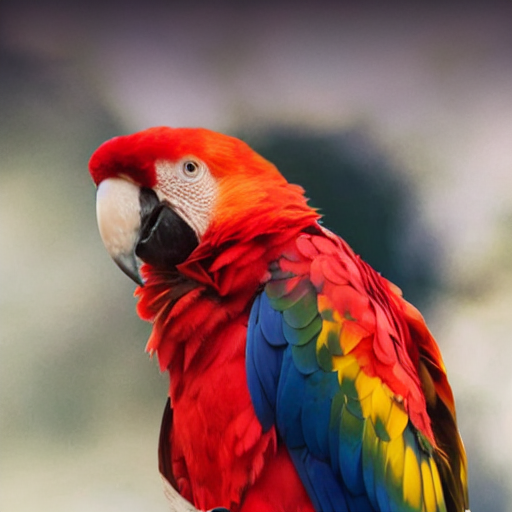

In [ ]:
# Decode this latent representation back into an image
decoded = latents_to_pil(encoded)[0]   # This is a list of PIL images
decoded

##Scheduler

In [ ]:
# Setting the number of sampling steps:
scheduler.set_timesteps(15)

In [ ]:
# See these in terms of the original 1000 steps used for training:
print(scheduler.timesteps)

tensor([999.0000, 927.6429, 856.2857, 784.9286, 713.5714, 642.2143, 570.8571,
        499.5000, 428.1429, 356.7857, 285.4286, 214.0714, 142.7143,  71.3571,
          0.0000], dtype=torch.float64)


In [ ]:
# Look at the equivalent noise levels:
print(scheduler.sigmas)

tensor([14.6146,  9.6826,  6.6780,  4.7746,  3.5221,  2.6666,  2.0606,  1.6156,
         1.2768,  1.0097,  0.7913,  0.6056,  0.4397,  0.2780,  0.0292,  0.0000])


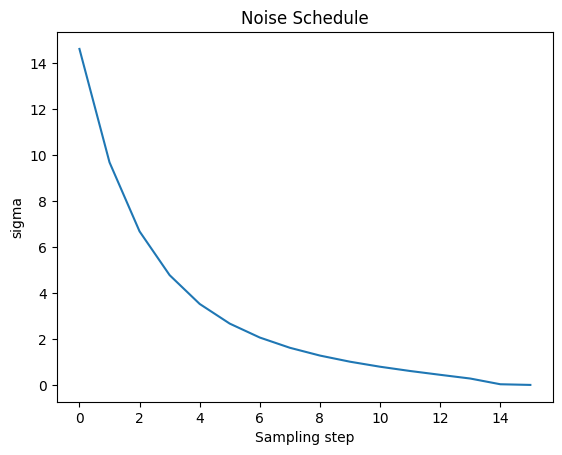

In [ ]:
# Plotting this noise schedule:
plt.plot(scheduler.sigmas)
plt.title('Noise Schedule')
plt.xlabel('Sampling step')
plt.ylabel('sigma')
plt.show()

torch.Size([1, 4, 64, 64])


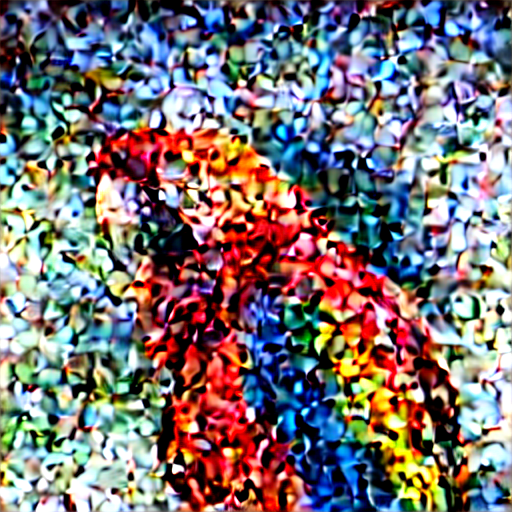

In [ ]:
noise = torch.randn_like(encoded) # Random noise
print(noise.shape)
sampling_step = 8 # Equivalent to step 8 out of 15 in the schedule above
# encoded_and_noised = scheduler.add_noise(encoded, noise, timestep) # Diffusers 0.3 and below
encoded_and_noised = scheduler.add_noise(encoded, noise, timesteps=torch.tensor([scheduler.timesteps[sampling_step]]))
latents_to_pil(encoded_and_noised.float())[0] # Display

In [ ]:
# ??scheduler.add_noise

##Loop starting from noised version of input (AKA image2image)

0it [00:00, ?it/s]

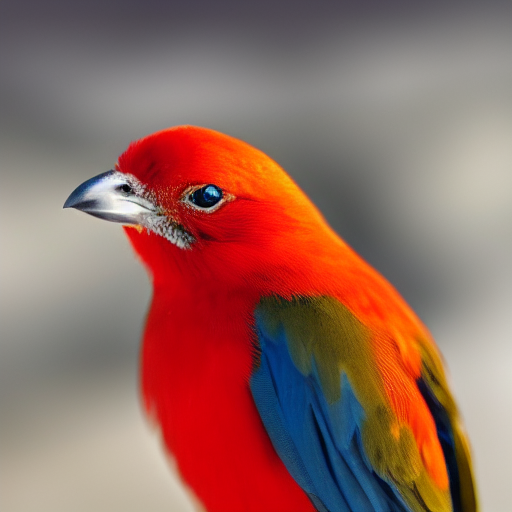

In [ ]:
# Settings (same as before except for the new prompt)
prompt = ["A bird"]
height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion
num_inference_steps = 50            # Number of denoising steps
guidance_scale = 8                  # Scale for classifier-free guidance
generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise
batch_size = 1

# Prep text (same as before)
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
with torch.no_grad():
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0] 
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

# Prep Scheduler (setting the number of inference steps)
scheduler.set_timesteps(num_inference_steps)

# Prep latents (noising appropriately for start_step)
start_step = 10
start_sigma = scheduler.sigmas[start_step]
noise = torch.randn_like(encoded)
latents = scheduler.add_noise(encoded, noise, timesteps=torch.tensor([scheduler.timesteps[start_step]]))
latents = latents.to(torch_device).float()

# Loop
for i, t in tqdm(enumerate(scheduler.timesteps)):
    if i >= start_step: # << This is the only modification to the loop we do
        
        # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
        latent_model_input = torch.cat([latents] * 2)
        sigma = scheduler.sigmas[i]
        latent_model_input = scheduler.scale_model_input(latent_model_input, t)

        # predict the noise residual
        with torch.no_grad():
            noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

        # perform guidance
        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        # compute the previous noisy sample x_t -> x_t-1
        latents = scheduler.step(noise_pred, t, latents).prev_sample

latents_to_pil(latents)[0]

##Exploring the text -> embedding pipeline

In [ ]:
# Our text prompt
prompt = 'A picture of a puppy'

In [ ]:
tokenizer.model_max_length

77

In [ ]:
# Turn the text into a sequnce of tokens:
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
print(text_input.input_ids.shape)
text_input['input_ids'][0] # View the tokens

torch.Size([1, 77])


tensor([49406,   320,  1674,   539,   320,  6829, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407])

In [ ]:
# See the individual tokens
for t in text_input['input_ids'][0][:8]: # We'll just look at the first 7 to save you from a wall of '<|endoftext|>'
    print(t, tokenizer.decoder.get(int(t)))

tensor(49406) <|startoftext|>
tensor(320) a</w>
tensor(1674) picture</w>
tensor(539) of</w>
tensor(320) a</w>
tensor(6829) puppy</w>
tensor(49407) <|endoftext|>
tensor(49407) <|endoftext|>


In [ ]:
# Grab the output embeddings
output_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]
print('Shape:', output_embeddings.shape)
output_embeddings

Shape: torch.Size([1, 77, 768])


tensor([[[-0.3884,  0.0229, -0.0522,  ..., -0.4899, -0.3066,  0.0675],
         [ 0.0290, -1.3258,  0.3085,  ..., -0.5257,  0.9768,  0.6652],
         [ 0.6942,  0.3538,  1.0991,  ..., -1.5716, -1.2643, -0.0121],
         ...,
         [-0.0221, -0.0053, -0.0089,  ..., -0.7303, -1.3830, -0.3011],
         [-0.0062, -0.0246,  0.0065,  ..., -0.7326, -1.3745, -0.2953],
         [-0.0536,  0.0269,  0.0444,  ..., -0.7159, -1.3634, -0.3075]]],
       device='cuda:0', grad_fn=<NativeLayerNormBackward0>)

In [ ]:
text_encoder.text_model.embeddings

CLIPTextEmbeddings(
  (token_embedding): Embedding(49408, 768)
  (position_embedding): Embedding(77, 768)
)

####Token embeddings

In [ ]:
# Access the embedding layer
token_emb_layer = text_encoder.text_model.embeddings.token_embedding
token_emb_layer # Vocab size 49408, emb_dim 768

Embedding(49408, 768)

In [ ]:
# Embed a token - in this case the one for 'puppy'
embedding = token_emb_layer(torch.tensor(6829, device=torch_device))
embedding.shape # 768-dim representation

torch.Size([768])

In [ ]:
token_embeddings = token_emb_layer(text_input.input_ids.to(torch_device))
print(token_embeddings.shape) # batch size 1, 77 tokens, 768 values for each
token_embeddings

torch.Size([1, 77, 768])


tensor([[[ 0.0011,  0.0032,  0.0003,  ..., -0.0018,  0.0003,  0.0019],
         [ 0.0013, -0.0011, -0.0126,  ..., -0.0124,  0.0120,  0.0080],
         [ 0.0235, -0.0118,  0.0110,  ...,  0.0049,  0.0078,  0.0160],
         ...,
         [ 0.0012,  0.0077, -0.0011,  ..., -0.0015,  0.0009,  0.0052],
         [ 0.0012,  0.0077, -0.0011,  ..., -0.0015,  0.0009,  0.0052],
         [ 0.0012,  0.0077, -0.0011,  ..., -0.0015,  0.0009,  0.0052]]],
       device='cuda:0', grad_fn=<EmbeddingBackward0>)

####Position embeddings

In [ ]:
pos_emb_layer = text_encoder.text_model.embeddings.position_embedding
pos_emb_layer

Embedding(77, 768)

In [ ]:
position_ids = text_encoder.text_model.embeddings.position_ids[:, :77]
position_embeddings = pos_emb_layer(position_ids)
print(position_embeddings.shape)
position_embeddings

torch.Size([1, 77, 768])


tensor([[[ 0.0016,  0.0020,  0.0002,  ..., -0.0013,  0.0008,  0.0015],
         [ 0.0042,  0.0029,  0.0002,  ...,  0.0010,  0.0015, -0.0012],
         [ 0.0018,  0.0007, -0.0012,  ..., -0.0029, -0.0009,  0.0026],
         ...,
         [ 0.0216,  0.0055, -0.0101,  ..., -0.0065, -0.0029,  0.0037],
         [ 0.0188,  0.0073, -0.0077,  ..., -0.0025, -0.0009,  0.0057],
         [ 0.0330,  0.0281,  0.0289,  ...,  0.0160,  0.0102, -0.0310]]],
       device='cuda:0', grad_fn=<EmbeddingBackward0>)

In [ ]:
# And combining them we get the final input embeddings
input_embeddings = token_embeddings + position_embeddings
print(input_embeddings.shape)
input_embeddings

torch.Size([1, 77, 768])


tensor([[[ 2.6770e-03,  5.2133e-03,  4.9323e-04,  ..., -3.1321e-03,
           1.0659e-03,  3.4316e-03],
         [ 5.5371e-03,  1.7510e-03, -1.2381e-02,  ..., -1.1410e-02,
           1.3508e-02,  6.8378e-03],
         [ 2.5356e-02, -1.1019e-02,  9.7663e-03,  ...,  1.9460e-03,
           6.8375e-03,  1.8573e-02],
         ...,
         [ 2.2781e-02,  1.3262e-02, -1.1241e-02,  ..., -8.0054e-03,
          -2.0560e-03,  8.9366e-03],
         [ 2.0026e-02,  1.5015e-02, -8.7638e-03,  ..., -4.0313e-03,
           1.8487e-05,  1.0885e-02],
         [ 3.4206e-02,  3.5826e-02,  2.7768e-02,  ...,  1.4465e-02,
           1.1110e-02, -2.5745e-02]]], device='cuda:0', grad_fn=<AddBackward0>)

In [ ]:
# The following combines all the above steps (but doesn't let us fiddle with them!)
text_encoder.text_model.embeddings(text_input.input_ids.to(torch_device))

tensor([[[ 2.6770e-03,  5.2133e-03,  4.9323e-04,  ..., -3.1321e-03,
           1.0659e-03,  3.4316e-03],
         [ 5.5371e-03,  1.7510e-03, -1.2381e-02,  ..., -1.1410e-02,
           1.3508e-02,  6.8378e-03],
         [ 2.5356e-02, -1.1019e-02,  9.7663e-03,  ...,  1.9460e-03,
           6.8375e-03,  1.8573e-02],
         ...,
         [ 2.2781e-02,  1.3262e-02, -1.1241e-02,  ..., -8.0054e-03,
          -2.0560e-03,  8.9366e-03],
         [ 2.0026e-02,  1.5015e-02, -8.7638e-03,  ..., -4.0313e-03,
           1.8487e-05,  1.0885e-02],
         [ 3.4206e-02,  3.5826e-02,  2.7768e-02,  ...,  1.4465e-02,
           1.1110e-02, -2.5745e-02]]], device='cuda:0', grad_fn=<AddBackward0>)

In [ ]:
def get_output_embeds(input_embeddings):
    # CLIP's text model uses causal mask, so we prepare it here:
    bsz, seq_len = input_embeddings.shape[:2]
    causal_attention_mask = text_encoder.text_model._build_causal_attention_mask(bsz, seq_len, dtype=input_embeddings.dtype)

    # Getting the output embeddings involves calling the model with passing output_hidden_states=True 
    # so that it doesn't just return the pooled final predictions:
    encoder_outputs = text_encoder.text_model.encoder(
        inputs_embeds=input_embeddings,
        attention_mask=None, # We aren't using an attention mask so that can be None
        causal_attention_mask=causal_attention_mask.to(torch_device),
        output_attentions=None,
        output_hidden_states=True, # We want the output embs not the final output
        return_dict=None,
    )

    # We're interested in the output hidden state only
    output = encoder_outputs[0]

    # There is a final layer norm we need to pass these through
    output = text_encoder.text_model.final_layer_norm(output)

    # And now they're ready!
    return output

out_embs_test = get_output_embeds(input_embeddings) # Feed through the model with our new function
print(out_embs_test.shape) # Check the output shape
out_embs_test # Inspect the output

torch.Size([1, 77, 768])


tensor([[[-0.3884,  0.0229, -0.0522,  ..., -0.4899, -0.3066,  0.0675],
         [ 0.0290, -1.3258,  0.3085,  ..., -0.5257,  0.9768,  0.6652],
         [ 0.6942,  0.3538,  1.0991,  ..., -1.5716, -1.2643, -0.0121],
         ...,
         [-0.0221, -0.0053, -0.0089,  ..., -0.7303, -1.3830, -0.3011],
         [-0.0062, -0.0246,  0.0065,  ..., -0.7326, -1.3745, -0.2953],
         [-0.0536,  0.0269,  0.0444,  ..., -0.7159, -1.3634, -0.3075]]],
       device='cuda:0', grad_fn=<NativeLayerNormBackward0>)

In [ ]:
prompt = 'A picture of a puppy'

# Tokenize
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
input_ids = text_input.input_ids.to(torch_device)

# Get token embeddings
token_embeddings = token_emb_layer(input_ids)

# The new embedding. In this case just the input embedding of token 2368...
replacement_token_embedding = text_encoder.get_input_embeddings()(torch.tensor(2368, device=torch_device))

# Insert this into the token embeddings (
token_embeddings[0, torch.where(input_ids[0]==6829)] = replacement_token_embedding.to(torch_device)

# Combine with pos embs
input_embeddings = token_embeddings + position_embeddings

#  Feed through to get final output embs
modified_output_embeddings = get_output_embeds(input_embeddings)

print(modified_output_embeddings.shape)
modified_output_embeddings

torch.Size([1, 77, 768])


tensor([[[-0.3884,  0.0229, -0.0522,  ..., -0.4899, -0.3066,  0.0675],
         [ 0.0290, -1.3258,  0.3085,  ..., -0.5257,  0.9768,  0.6652],
         [ 0.6942,  0.3538,  1.0991,  ..., -1.5716, -1.2643, -0.0121],
         ...,
         [-0.6034, -0.5322,  0.0629,  ..., -0.3964,  0.0877, -0.9558],
         [-0.5936, -0.5407,  0.0731,  ..., -0.3876,  0.0906, -0.9436],
         [-0.6393, -0.4703,  0.1103,  ..., -0.3904,  0.1351, -0.9726]]],
       device='cuda:0', grad_fn=<NativeLayerNormBackward0>)

In [ ]:
#Generating an image with these modified embeddings

def generate_with_embs(text_embeddings):
    height = 512                        # default height of Stable Diffusion
    width = 512                         # default width of Stable Diffusion
    num_inference_steps = 30            # Number of denoising steps
    guidance_scale = 7.5                # Scale for classifier-free guidance
    generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise
    batch_size = 1

    max_length = text_input.input_ids.shape[-1]
    uncond_input = tokenizer(
      [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
    )
    with torch.no_grad():
        uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0] 
    text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

    # Prep Scheduler
    scheduler.set_timesteps(num_inference_steps)

    # Prep latents
    latents = torch.randn(
    (batch_size, unet.in_channels, height // 8, width // 8),
    generator=generator,
    )
    latents = latents.to(torch_device)
    latents = latents * scheduler.init_noise_sigma

    # Loop
    for i, t in tqdm(enumerate(scheduler.timesteps)):
        # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
        latent_model_input = torch.cat([latents] * 2)
        sigma = scheduler.sigmas[i]
        latent_model_input = scheduler.scale_model_input(latent_model_input, t)

        # predict the noise residual
        with torch.no_grad():
            noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

        # perform guidance
        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        # compute the previous noisy sample x_t -> x_t-1
        latents = scheduler.step(noise_pred, t, latents).prev_sample

    return latents_to_pil(latents)[0]

<ipython-input-64-0fc356ceec5d>:24: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (batch_size, unet.in_channels, height // 8, width // 8),


0it [00:00, ?it/s]

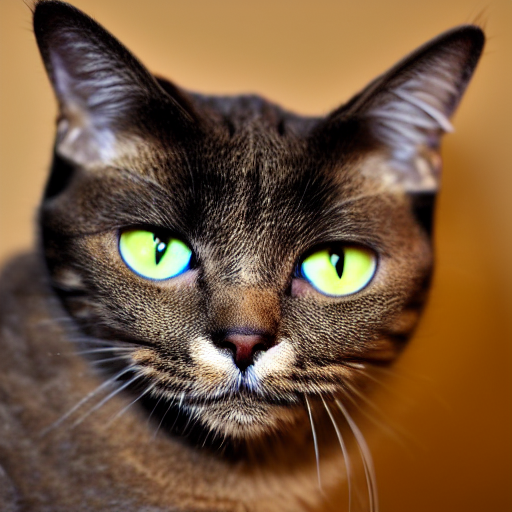

In [ ]:
generate_with_embs(modified_output_embeddings)

In [ ]:
# In case you're wondering how to get the token for a word, or the embedding for a token:
prompt = 'skunk'
print('tokenizer(prompt):', tokenizer(prompt))
print('token_emb_layer([token_id]) shape:', token_emb_layer(torch.tensor([8797], device=torch_device)).shape)

tokenizer(prompt): {'input_ids': [49406, 42194, 49407], 'attention_mask': [1, 1, 1]}
token_emb_layer([token_id]) shape: torch.Size([1, 768])


<ipython-input-64-0fc356ceec5d>:24: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (batch_size, unet.in_channels, height // 8, width // 8),


0it [00:00, ?it/s]

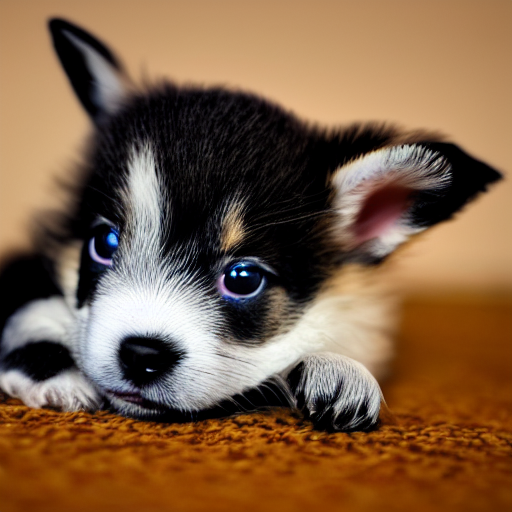

In [ ]:
prompt = 'A picture of a puppy'

# Tokenize
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
input_ids = text_input.input_ids.to(torch_device)

# Get token embeddings
token_embeddings = token_emb_layer(input_ids)

# The new embedding. Which is now a mixture of the token embeddings for 'puppy' and 'skunk'
puppy_token_embedding = token_emb_layer(torch.tensor(6829, device=torch_device))
skunk_token_embedding = token_emb_layer(torch.tensor(42194, device=torch_device))
replacement_token_embedding = 0.5*puppy_token_embedding + 0.5*skunk_token_embedding

# Insert this into the token embeddings (
token_embeddings[0, torch.where(input_ids[0]==6829)] = replacement_token_embedding.to(torch_device)

# Combine with pos embs
input_embeddings = token_embeddings + position_embeddings

#  Feed through to get final output embs
modified_output_embeddings = get_output_embeds(input_embeddings)

# Generate an image with these
generate_with_embs(modified_output_embeddings)

In [ ]:
birb_embed = torch.load('/content/learned_embeds.bin')
birb_embed.keys(), birb_embed['<birb-style>'].shape

(dict_keys(['<birb-style>']), torch.Size([768]))

<ipython-input-64-0fc356ceec5d>:24: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (batch_size, unet.in_channels, height // 8, width // 8),


0it [00:00, ?it/s]

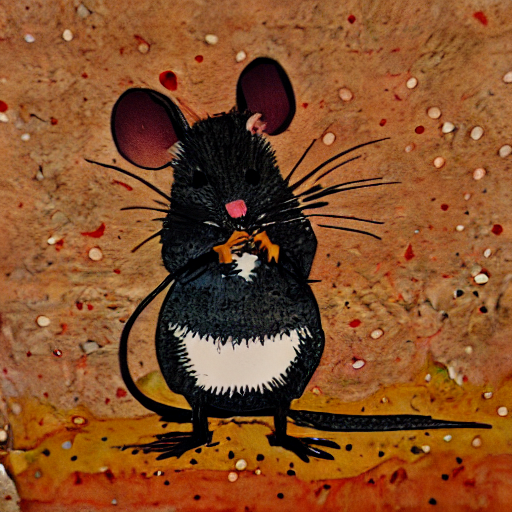

In [ ]:
prompt = 'A mouse in the style of puppy'

# Tokenize
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
input_ids = text_input.input_ids.to(torch_device)

# Get token embeddings
token_embeddings = token_emb_layer(input_ids)

# The new embedding - our special birb word
replacement_token_embedding = birb_embed['<birb-style>'].to(torch_device)

# Insert this into the token embeddings
token_embeddings[0, torch.where(input_ids[0]==6829)] = replacement_token_embedding.to(torch_device)

# Combine with pos embs
input_embeddings = token_embeddings + position_embeddings

#  Feed through to get final output embs
modified_output_embeddings = get_output_embeds(input_embeddings)

# And generate an image with this:
generate_with_embs(modified_output_embeddings)

<ipython-input-64-0fc356ceec5d>:24: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (batch_size, unet.in_channels, height // 8, width // 8),


0it [00:00, ?it/s]

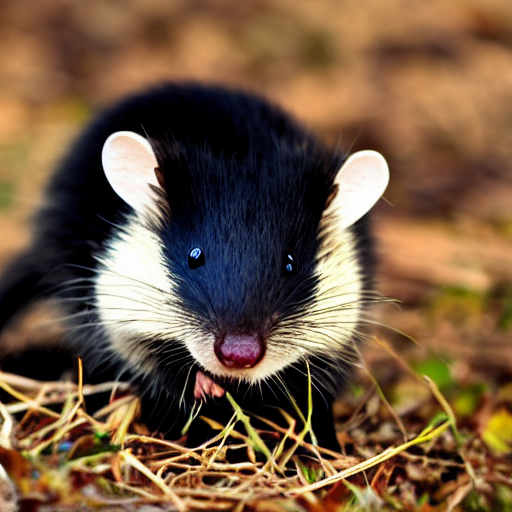

In [ ]:
# Embed two prompts
text_input1 = tokenizer(["A mouse"], padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
text_input2 = tokenizer(["A skunk"], padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings1 = text_encoder(text_input1.input_ids.to(torch_device))[0]
    text_embeddings2 = text_encoder(text_input2.input_ids.to(torch_device))[0]

# Mix them together
mix_factor = 0.35
mixed_embeddings = (text_embeddings1*mix_factor + \
                   text_embeddings2*(1-mix_factor))

# Generate!
generate_with_embs(mixed_embeddings)

##The UNET and CFG

In [ ]:
# Prep Scheduler
scheduler.set_timesteps(num_inference_steps)

# What is our timestep
t = scheduler.timesteps[0]
sigma = scheduler.sigmas[0]

# A noisy latent
latents = torch.randn(
  (batch_size, unet.in_channels, height // 8, width // 8),
  generator=generator,
)
latents = latents.to(torch_device)
latents = latents * scheduler.init_noise_sigma

# Text embedding
text_input = tokenizer(['A macaw'], padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]

# Run this through the unet to predict the noise residual
with torch.no_grad():
    noise_pred = unet(latents, t, encoder_hidden_states=text_embeddings)["sample"]

latents.shape, noise_pred.shape # We get preds in the same shape as the input

<ipython-input-80-ad3a218cb10a>:10: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (batch_size, unet.in_channels, height // 8, width // 8),


(torch.Size([1, 4, 64, 64]), torch.Size([1, 4, 64, 64]))

In [ ]:
prompt = 'Oil painting of an orangutan with sunglass'
height = 512                      
width = 512                        
num_inference_steps = 50
guidance_scale = 8    
generator = torch.manual_seed(32)
batch_size = 1

# Make a folder to store results
!rm -rf steps/
!mkdir -p steps/

# Prep text 
text_input = tokenizer([prompt], padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
with torch.no_grad():
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0] 
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

# Prep Scheduler
scheduler.set_timesteps(num_inference_steps)

# Prep latents
latents = torch.randn(
  (batch_size, unet.in_channels, height // 8, width // 8),
  generator=generator,
)
latents = latents.to(torch_device)
latents = latents * scheduler.init_noise_sigma

# Loop
for i, t in tqdm(enumerate(scheduler.timesteps)):
    # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
    latent_model_input = torch.cat([latents] * 2)
    sigma = scheduler.sigmas[i]
    latent_model_input = scheduler.scale_model_input(latent_model_input, t)

    # predict the noise residual
    with torch.no_grad():
        noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

    # perform guidance
    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)
    
    # Get the predicted x0:
    # latents_x0 = latents - sigma * noise_pred # Calculating ourselves
    latents_x0 = scheduler.step(noise_pred, t, latents).pred_original_sample # Using the scheduler (Diffusers 0.4 and above)

    # compute the previous noisy sample x_t -> x_t-1
    latents = scheduler.step(noise_pred, t, latents).prev_sample

    # To PIL Images
    im_t0 = latents_to_pil(latents_x0)[0]
    im_next = latents_to_pil(latents)[0]

    # Combine the two images and save for later viewing
    im = Image.new('RGB', (1024, 512))
    im.paste(im_next, (0, 0))
    im.paste(im_t0, (512, 0))
    im.save(f'steps/{i:04}.jpeg')

<ipython-input-83-aba976a872af>:30: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (batch_size, unet.in_channels, height // 8, width // 8),


0it [00:00, ?it/s]

In [ ]:
# Make and show the progress video (change width to 1024 for full res)
!ffmpeg -v 1 -y -f image2 -framerate 12 -i steps/%04d.jpeg -c:v libx264 -preset slow -qp 18 -pix_fmt yuv420p out.mp4
mp4 = open('out.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

##Guidance

In [ ]:
def blue_loss(images):
    print(type(images), images.shape)
    # How far are the red channel values to 0.9:
    error = torch.abs(images[:,2] - 0.9).mean() # [:,2] -> all images in batch, only the red channel
    return error

In [ ]:
prompt = 'Oil painting of car' #@param
height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion
num_inference_steps = 50  #@param           # Number of denoising steps
guidance_scale = 8 #@param               # Scale for classifier-free guidance
generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise
batch_size = 1
blue_loss_scale = 200 #@param


In [ ]:
# Prep text 
text_input = tokenizer([prompt], padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]

# And the uncond. input as before:
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
with torch.no_grad():
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0] 
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

# Prep Scheduler
scheduler.set_timesteps(num_inference_steps)

# Prep latents
latents = torch.randn(
  (batch_size, unet.in_channels, height // 8, width // 8),
  generator=generator,
)
latents = latents.to(torch_device)
latents = latents * scheduler.init_noise_sigma


<ipython-input-96-59989f55d9eb>:20: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (batch_size, unet.in_channels, height // 8, width // 8),


0it [00:00, ?it/s]

<class 'torch.Tensor'> torch.Size([1, 3, 512, 512])
0 loss: 124.09295654296875
<class 'torch.Tensor'> torch.Size([1, 3, 512, 512])
<class 'torch.Tensor'> torch.Size([1, 3, 512, 512])
10 loss: 28.752910614013672
<class 'torch.Tensor'> torch.Size([1, 3, 512, 512])
<class 'torch.Tensor'> torch.Size([1, 3, 512, 512])
20 loss: 21.327533721923828
<class 'torch.Tensor'> torch.Size([1, 3, 512, 512])
<class 'torch.Tensor'> torch.Size([1, 3, 512, 512])
30 loss: 18.731311798095703
<class 'torch.Tensor'> torch.Size([1, 3, 512, 512])
<class 'torch.Tensor'> torch.Size([1, 3, 512, 512])
40 loss: 17.759672164916992
<class 'torch.Tensor'> torch.Size([1, 3, 512, 512])


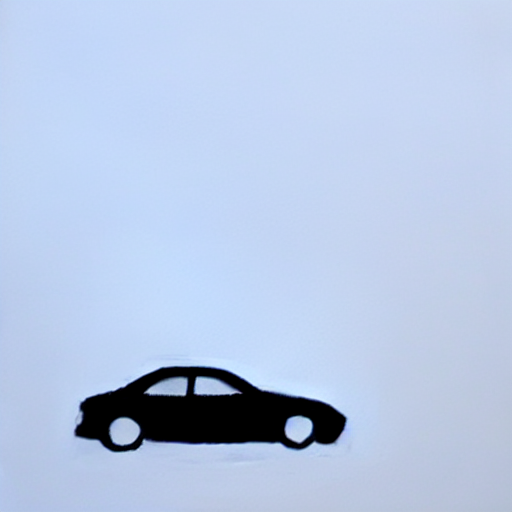

In [ ]:
# Loop
for i, t in tqdm(enumerate(scheduler.timesteps)):
    # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
    latent_model_input = torch.cat([latents] * 2)
    sigma = scheduler.sigmas[i]
    latent_model_input = scheduler.scale_model_input(latent_model_input, t)

    # predict the noise residual
    with torch.no_grad():
        noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

    # perform CFG
    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)
    
    #### ADDITIONAL GUIDANCE ###
    if i%5 == 0:
        # Requires grad on the latents
        latents = latents.detach().requires_grad_()

        # Get the predicted x0:
        # latents_x0 = latents - sigma * noise_pred
        latents_x0 = scheduler.step(noise_pred, t, latents).pred_original_sample

        # Decode to image space
        denoised_images = vae.decode((1 / 0.18215) * latents_x0).sample / 2 + 0.5 # range (0, 1)        

        # Calculate loss
        loss = blue_loss(denoised_images) * blue_loss_scale
        
        # Occasionally print it out
        if i%10==0:
            print(i, 'loss:', loss.item())

        # Get gradient
        cond_grad = torch.autograd.grad(loss, latents)[0]

        # Modify the latents based on this gradient
        latents = latents.detach() - cond_grad * sigma**2
    
    # Now step with scheduler
    latents = scheduler.step(noise_pred, t, latents).prev_sample


latents_to_pil(latents)[0]

# Training a model with winged drones alone, save it. Then, later create a creative_loss using the embeddings to force a  pattern
- Create a model(similar to CIFAR10) that will predict 4 flying objects but we will feed winged drones images only
- Maintain a layer in the model with embeddings of size [B, 3, 512, 512] 
- Prepare dataset only with winged drones
- Prepare dataloader & feed to the model
- Once model training is over, extract this layer alone
- Feed this layer to blue_loss so that we can force a pattern of winged drones in the images we are generating

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
from __future__ import print_function
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.optim.lr_scheduler import OneCycleLR
import os
from PIL import Image
import numpy as np
import albumentations as A
import albumentations.pytorch as AP
import random
from tqdm import tqdm
import matplotlib.pyplot as plt

In [4]:
# This zip file has 4 folders 'Flying Birds', 'Large QuadCopters', 'Small QuadCopters', 'Winged Drones'
# But we will train only on Winged Drones
%%time
from zipfile import ZipFile
with ZipFile('/content/gdrive/My Drive/ThumbnailData.zip', mode='r') as input:
  input.extractall('.')

CPU times: user 1.44 s, sys: 1.18 s, total: 2.62 s
Wall time: 5.38 s


In [5]:
# Retaining images only in Winged Drones folder & creating empty folders for rest 3 classes
!rm -rf '/content/Data/Flying Birds'
!rm -rf '/content/Data/Large QuadCopters'
!rm -rf '/content/Data/Small QuadCopters'

!mkdir '/content/Data/Flying Birds'
!mkdir '/content/Data/Large QuadCopters'
!mkdir '/content/Data/Small QuadCopters'

In [6]:
def prepare_data(root, classes):
  finaldata = []
  for i in range(len(classes)):
    path = root + '/' + classes[i] + '/'
    data_rec = [(path+file_name, i) for file_name in os.listdir(path)]
    finaldata.extend(data_rec) 
  random.shuffle(finaldata)
  return finaldata

In [7]:
# Expected --> Dataset Length:5218, Train Data length: 3652,Test Data length: 1565
class_names = ['Flying Birds', 'Large QuadCopters', 'Small QuadCopters', 'Winged Drones']
dataset = prepare_data('/content/Data',class_names)
print(f'Dataset Length:{len(dataset)}, Train Data length: {int(len(dataset)*0.7)},Test Data length: {int(len(dataset)*0.3)}')
train_len = int(len(dataset)*0.7)

Dataset Length:5218, Train Data length: 3652,Test Data length: 1565


In [8]:
class Customdataset(Dataset):
  def __init__(self, data, transform=None):
    self.images, self.labels     = zip(*data)
    self.transform               = transform 

  def __len__(self):
    return len(self.images)  
    
  # Whenever we refer index from main ipynb file __getitem__ dunder method will get invoked. Also index parameter below will be a list when we are calling as batches.
  
  def __getitem__(self,index):
    if torch.is_tensor(index):
       index = index.tolist()
    
    image = Image.open(self.images[index])  
    if self.transform:
      image = self.transform(image)

    return image, self.labels[index]

In [9]:
# define transform to convert images to PyTorch tensors
train_transforms = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor()
])

channel_means  = (0.48043839, 0.44820218, 0.39760034)
channel_stdevs = (0.27698959, 0.26908774, 0.28216029)

train = Customdataset(dataset[:train_len],train_transforms)
train_loader  = DataLoader(train, batch_size = 16,shuffle = True, pin_memory = True)
dataiter = iter(train_loader)

In [10]:
def unnormalize(img):
  img = img.cpu().numpy().astype(dtype=np.float32)
  for i in range(img.shape[0]):
    img[i] = (img[i]*channel_stdevs[i]) + channel_means[i]
  return np.transpose(img, (1,2,0))

To check images come out correctly as batches, images.shape: torch.Size([16, 3, 512, 512]), labels.shape: torch.Size([16])


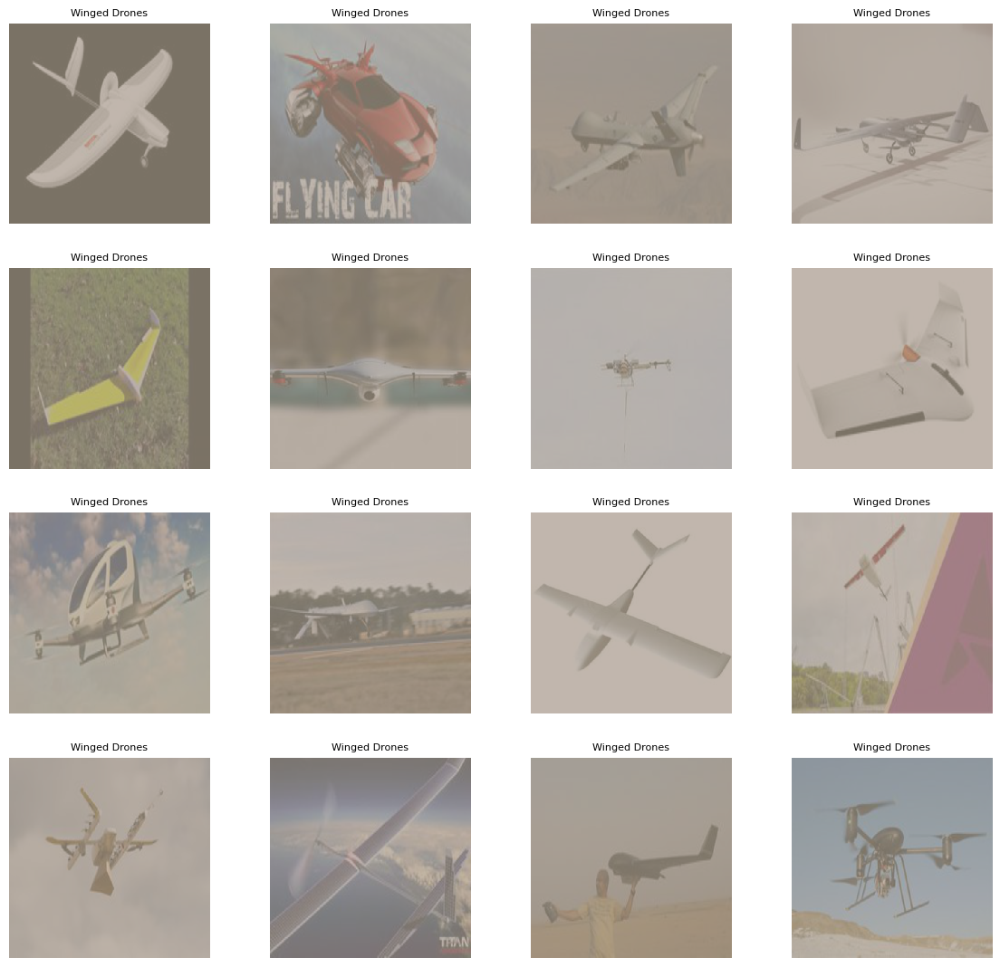

In [11]:
images, labels = next(dataiter)
print(f'To check images come out correctly as batches, images.shape: {images.shape}, labels.shape: {labels.shape}')
num_classes = len(class_names)
r, c = 4, 4
fig = plt.figure(figsize=(14,14))
fig.subplots_adjust(hspace=0.01, wspace=0.3)
for i in range(r):
  for j in range(c):
    idx = i*c + j
    ax  = plt.subplot(r,c, idx + 1)
    ax.set_title(class_names[labels[idx]][:30], fontdict={'fontsize':8})
    plt.axis('off')
    ax.imshow(unnormalize(images[idx]), interpolation ='none')
plt.show() 

In [12]:
class Net(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Net, self).__init__()
        
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1) # [3, 512, 512] -> [32, 512, 512]
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu1 = nn.ReLU(inplace=True)
        
        self.conv2 = nn.Conv2d(out_channels, out_channels * 2, kernel_size=3, padding=1) # [32, 512, 512] -> [64, 512, 512]
        self.bn2 = nn.BatchNorm2d(out_channels * 2)
        self.relu2 = nn.ReLU(inplace=True)
        
        self.conv3 = nn.Conv2d(out_channels * 2, out_channels * 4, kernel_size=3, padding=1) # [64, 512, 512] -> [128, 512, 512]
        self.bn3 = nn.BatchNorm2d(out_channels * 4)
        self.relu3 = nn.ReLU(inplace=True)

        self.conv_extr = nn.Conv2d(out_channels * 4, 3, kernel_size=3, padding=1) # [128, 512, 512] -> [3, 512, 512]
        self.bn_extr = nn.BatchNorm2d(3)
        self.relu_extr = nn.ReLU(inplace=True)   

        self.pool1 = nn.MaxPool2d(2, 2)     # [128, 512, 512] -> [128, 256, 256]

        self.conv4 = nn.Conv2d(out_channels * 4, out_channels * 2, kernel_size=3, padding=1) # [128, 256, 256] -> [64, 256, 256]
        self.bn4 = nn.BatchNorm2d(out_channels * 2)
        self.relu4 = nn.ReLU(inplace=True)    

        self.conv5 = nn.Conv2d(out_channels * 2, out_channels, kernel_size=3, padding=1) # [64, 256, 256] -> [32, 256, 256]
        self.bn5 = nn.BatchNorm2d(out_channels)
        self.relu5 = nn.ReLU(inplace=True)

        self.pool2 = nn.MaxPool2d(2, 2)     # [32, 256, 256] -> [32, 128, 128]     

        self.conv6 = nn.Conv2d(out_channels, out_channels // 2, kernel_size=3, padding=1) # [32, 128, 128] -> [16, 128, 128]
        self.bn6 = nn.BatchNorm2d(out_channels // 2)
        self.relu6 = nn.ReLU(inplace=True)    

        self.conv7 = nn.Conv2d(out_channels // 2, out_channels // 2, kernel_size=3, padding=1) # [16, 128, 128] -> [16, 128, 128]
        self.bn7 = nn.BatchNorm2d(out_channels // 2)
        self.relu7 = nn.ReLU(inplace=True)

        self.pool3 = nn.MaxPool2d(2, 2)     # [16, 128, 128] -> [16, 64, 64]     

        self.conv8 = nn.Conv2d(out_channels // 2, out_channels // 2, kernel_size=3, padding=1) # [16, 64, 64] -> [16, 64, 64]
        self.bn8 = nn.BatchNorm2d(out_channels // 2)
        self.relu8 = nn.ReLU(inplace=True)    

        self.conv9 = nn.Conv2d(out_channels // 2, out_channels // 2, kernel_size=3, padding=1) # [16, 64, 64] -> [16, 64, 64]
        self.bn9 = nn.BatchNorm2d(out_channels // 2)
        self.relu9 = nn.ReLU(inplace=True)

        self.pool4 = nn.MaxPool2d(2, 2)     # [16, 64, 64] -> [16, 32, 32]      

        self.conv10 = nn.Conv2d(out_channels // 2, out_channels // 2, kernel_size=3, padding=1) # [16, 32, 32] -> [16, 32, 32] 
        self.bn10 = nn.BatchNorm2d(out_channels // 2)
        self.relu10 = nn.ReLU(inplace=True)    

        self.conv11 = nn.Conv2d(out_channels // 2, out_channels // 2, kernel_size=3, padding=1) # [16, 32, 32] -> [16, 32, 32] 
        self.bn11 = nn.BatchNorm2d(out_channels // 2)
        self.relu11 = nn.ReLU(inplace=True)

        self.pool5 = nn.MaxPool2d(2, 2)     # [16, 32, 32] -> [16, 16, 16]  

        self.conv12 = nn.Conv2d(out_channels // 2, out_channels // 2, kernel_size=3, padding=1) # [16, 16, 16] -> [16, 16, 16] 
        self.bn12 = nn.BatchNorm2d(out_channels // 2)
        self.relu12 = nn.ReLU(inplace=True)    

        self.conv13 = nn.Conv2d(out_channels // 2, out_channels // 2, kernel_size=3, padding=1) # [16, 16, 16] -> [16, 16, 16]
        self.bn13 = nn.BatchNorm2d(out_channels // 2)
        self.relu13 = nn.ReLU(inplace=True)

        self.pool6 = nn.MaxPool2d(2, 2)     # [16, 16, 16] -> [16, 8, 8]                                

        # OUTPUT BLOCK
        self.Gap1 = nn.Sequential(
            nn.AvgPool2d(kernel_size=8)
        )  # in = 8x8x16 , out = 1x1x16
        
        self.fc1 = nn.Sequential(
            nn.Conv2d(in_channels=16, out_channels=10, kernel_size=(1, 1), padding=0, bias=False)
        )  # in = 1x1x16 , out = 1x1x10  
        
    def forward(self, x):
        x = self.relu1(self.bn1(self.conv1(x)))
        x = self.relu2(self.bn2(self.conv2(x)))
        x = self.relu3(self.bn3(self.conv3(x)))             
    
        x_extr = self.relu_extr(self.bn_extr(self.conv_extr(x)))

        x = self.pool1(x)

        x = self.relu4(self.bn4(self.conv4(x))) 
        x = self.relu5(self.bn5(self.conv5(x))) 
        x = self.pool2(x)
        
        x = self.relu6(self.bn6(self.conv6(x))) 
        x = self.relu7(self.bn7(self.conv7(x))) 
        x = self.pool3(x)

        x = self.relu8(self.bn8(self.conv8(x))) 
        x = self.relu9(self.bn9(self.conv9(x))) 
        x = self.pool4(x)   

        x = self.relu10(self.bn10(self.conv10(x))) 
        x = self.relu11(self.bn11(self.conv11(x))) 
        x = self.pool5(x)  

        x = self.relu12(self.bn12(self.conv12(x))) 
        x = self.relu13(self.bn13(self.conv13(x))) 
        x = self.pool6(x)               
        
        x = self.fc1(self.Gap1(x))
        x = x.view(-1, 10)
        
        return F.log_softmax(x, dim=-1)

In [13]:
!pip install torchsummary
from torchsummary import summary
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
print(device)
model = Net(in_channels=3, out_channels=32).to(device)
summary(model, input_size=(3, 512, 512))

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
cuda
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 512, 512]             896
       BatchNorm2d-2         [-1, 32, 512, 512]              64
              ReLU-3         [-1, 32, 512, 512]               0
            Conv2d-4         [-1, 64, 512, 512]          18,496
       BatchNorm2d-5         [-1, 64, 512, 512]             128
              ReLU-6         [-1, 64, 512, 512]               0
            Conv2d-7        [-1, 128, 512, 512]          73,856
       BatchNorm2d-8        [-1, 128, 512, 512]             256
              ReLU-9        [-1, 128, 512, 512]               0
           Conv2d-10          [-1, 3, 512, 512]           3,459
      BatchNorm2d-11          [-1, 3, 512, 512]               6
             ReLU-12          [-1, 3, 512, 512]               0

In [14]:
# # class for Calculating and storing training losses and training accuracies of model for each batch per epoch ## 
class Train_loss:
        
      def train_loss_calc(self,model, device, train_loader, optimizer, epoch, factor, criterion, scheduler =None, print_idx=0, maxlr=0):
            
          self.model        = model
          self.device       = device
          self.train_loader = train_loader
          self.optimizer    = optimizer   
          self.epoch        = epoch
          self.factor       = factor
          self.criterion    = criterion      
          self.scheduler    = scheduler
          self.print_idx    = print_idx
          self.maxlr        = maxlr    
          self.metric       = 0      
          
          model.train()
          pbar = tqdm(train_loader)  # Wrapping train_loader in tqdm to show progress bar for each epoch while training          
            
          correct             = 0
          total               = 0
          train_losses        = []
          train_acc           = []
          
          for batch_idx, data in enumerate(pbar,0):
                        
              images, labels = data        
                       
              images, labels = images.to(device), labels.to(device)   # Moving images and correspondig labels to GPU
              optimizer.zero_grad()  # Zeroing out gradients at start of each batch so that backpropagation won't take accumulated value
              labels_pred = model(images)  # Calling CNN model to predict the images
              loss = criterion(labels_pred, labels)   # Calculating Negative Likelihood Loss by comparing prediction vs ground truth
              
              # Applying L1 regularization to the training loss calculated
              L1_criterion = nn.L1Loss(size_average = None, reduce = None, reduction = 'mean')
              reg_loss     = 0
              for param in model.parameters():
                zero_tensor = torch.rand_like(param) * 0 # Creating a zero tensor with same size as param
                reg_loss    += L1_criterion(param, zero_tensor)
              loss += factor * reg_loss 
              
            
              # Backpropagation
              loss.backward()
              optimizer.step()
              
              # This was used for OneCycle LR policy. 'get_last_lr()' giving error while using ReduceLRonPlateau hence commenting out 
              #lr = self.scheduler.get_last_lr()[0] if self.scheduler else (self.optimizer.lr_scheduler.get_last_lr()[0] if self.optimizer.lr_scheduler else self.optimizer.param_groups[0]['lr'])
              
              lr = 0
              if scheduler and not (isinstance(self.scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau)):
                 lr = self.scheduler.get_last_lr()[0]   # Won't work for ReduceLRonPlateau
              else:
                 lr = self.optimizer.param_groups[0]['lr']  
  
              # Calculating accuracies
              labels_pred_max = labels_pred.argmax(dim = 1, keepdim = True) # Getting the index of max log probablity predicted by model
              correct         += labels_pred_max.eq(labels.view_as(labels_pred_max)).sum().item() # Getting count of correctly predicted
              total           += len(images) # Getting count of processed images
              train_acc_batch = (correct/total)*100            
              pbar.set_description(desc=f'Train Loss = {loss.item()} Batch Id = {batch_idx} Train Acc = {train_acc_batch:0.2f} LR ={lr:0.6f}')                                       
     
          train_acc.append(train_acc_batch)  # To capture only final batch accuracy of an epoch
          train_losses.append(loss)          # To capture only final batch loss of an epoch
        
          return train_losses, train_acc

In [15]:
train_loss = Train_loss()

EPOCH         = 5
L2_factor     = 0.0001
L1_factor     = 0.0005
least_loss_lr = 0.03

train_loss_all = []
train_acc_all  = []
classwise_acc  = []
class_acc_all  = []

OPTIMIZER = optim.SGD(model.parameters(),lr=least_loss_lr, momentum=0.9, weight_decay=L2_factor)
SCHEDULER = ReduceLROnPlateau(OPTIMIZER, mode='min',factor=0.1, min_lr=1e-7, patience =4, verbose=True)
criterion = nn.CrossEntropyLoss()

for epoch in range(EPOCH):
  print('\nEPOCH:', epoch)
  train_losses, train_acc = train_loss.train_loss_calc(model,device,train_loader=train_loader,optimizer=OPTIMIZER,
                                                       epoch=EPOCH, factor=L1_factor,criterion=criterion,
                                                       scheduler=SCHEDULER,print_idx=0,maxlr=0.2)

  train_loss_all.extend(train_losses)
  train_acc_all.extend(train_acc)

  if epoch%4 == 0:
    print(f' **** Model Saved in epoch:{epoch}')
    path_model_save = f'/content/gdrive/My Drive/EVA8_P1_S14/Extraction_V1_04292023V1.pt'
    torch.save(model.state_dict(),path_model_save)


EPOCH: 0


Train Loss = 0.007697788067162037 Batch Id = 228 Train Acc = 99.42 LR =0.030000: 100%|██████████| 229/229 [05:05<00:00,  1.34s/it]


 **** Model Saved in epoch:0

EPOCH: 1


Train Loss = 0.0076089841313660145 Batch Id = 228 Train Acc = 100.00 LR =0.030000: 100%|██████████| 229/229 [05:06<00:00,  1.34s/it]



EPOCH: 2


Train Loss = 0.007529159542173147 Batch Id = 228 Train Acc = 100.00 LR =0.030000: 100%|██████████| 229/229 [05:03<00:00,  1.33s/it]



EPOCH: 3


Train Loss = 0.007446891628205776 Batch Id = 228 Train Acc = 100.00 LR =0.030000: 100%|██████████| 229/229 [05:03<00:00,  1.32s/it]



EPOCH: 4


Train Loss = 0.00736904377117753 Batch Id = 228 Train Acc = 100.00 LR =0.030000: 100%|██████████| 229/229 [05:03<00:00,  1.33s/it]

 **** Model Saved in epoch:4


In [16]:
!cp -r '/content/gdrive/MyDrive/EVA8_P1_S14/Val_Data' '.'

In [17]:
# Preparing validation dataset with all the classes
class_names = ['Flying Birds', 'Large QuadCopters', 'Small QuadCopters', 'Winged Drones']
val_dataset = prepare_data('/content/Val_Data',class_names)
print(f'Validation Dataset Length:{len(val_dataset)}') 

Validation Dataset Length:32


In [18]:
val = Customdataset(val_dataset,train_transforms)
val_loader  = DataLoader(val, batch_size = 16)
valiter = iter(val_loader)

To check images come out correctly as batches, images.shape: torch.Size([16, 3, 512, 512]), labels.shape: torch.Size([16])


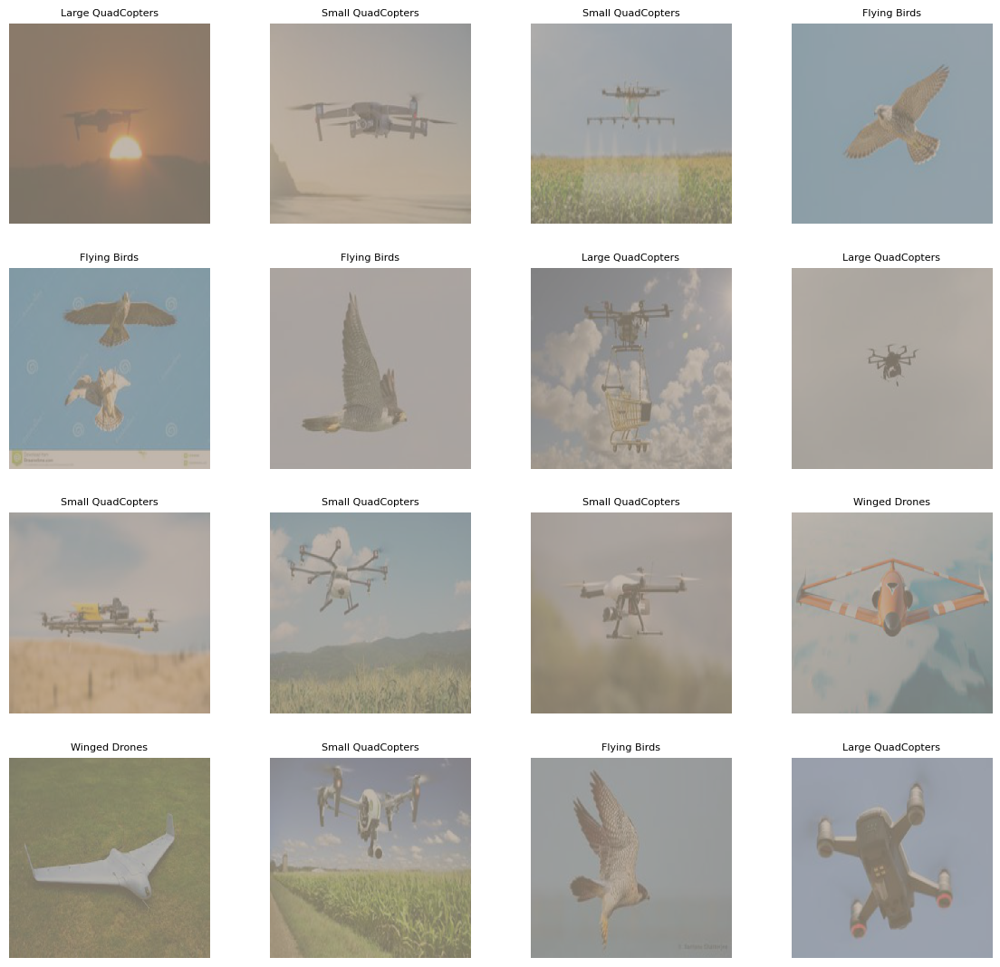

In [19]:
images, labels = next(valiter)
print(f'To check images come out correctly as batches, images.shape: {images.shape}, labels.shape: {labels.shape}')
num_classes = len(class_names)
r, c = 4, 4
fig = plt.figure(figsize=(14,14))
fig.subplots_adjust(hspace=0.01, wspace=0.3)
for i in range(r):
  for j in range(c):
    idx = i*c + j
    ax  = plt.subplot(r,c, idx + 1)
    ax.set_title(class_names[labels[idx]][:30], fontdict={'fontsize':8})
    plt.axis('off')
    ax.imshow(unnormalize(images[idx]), interpolation ='none')
plt.show() 

In [20]:
class Test_loss:

       def test_loss_calc(self,model, device, test_loader, optimizer, total_epoch, current_epoch, criterion, scheduler):
           self.model        = model
           self.device       = device
           self.test_loader  = test_loader
           self.optimizer    = optimizer
           self.total_epoch  = total_epoch
           self.current_epoch= current_epoch
           self.criterion    = criterion
           self.scheduler    = scheduler
       
           model.eval()
           
           correct        = 0 
           total          = 0              
           test_loss      = 0
           test_accuracy  = 0 
           test_losses    = []
           test_acc       = []                 
                        
           with torch.no_grad():                     # For test data, we won't do backprop, hence no need to capture gradients
                for images,labels in test_loader:    # We are working in GPU, so 1 iteration will process 128 images(batch_size) in a go. Total 10,000/128 = 79 iterations will happen
 
                    images,labels    = images.to(device),labels.to(device)                                      # Images -> Tensor with shape torch.Size([128, 3, 32, 32])
                    labels_pred      = model(images)                                                            # labels_pred -> Tensor with shape torch.Size([128, 10]) 
                    test_loss        += criterion(labels_pred, labels).item()                                   # Use torch.Tensor.item() to get a Python number from a tensor containing a single value                
                    labels_pred_max  = labels_pred.argmax(dim =1, keepdim = True)                               # labels_pred_max -> Tensor with shape torch.Size([128, 1]). We are taking maximum value out of 10 from 'labels_pred' tensor
                    correct          += labels_pred_max.eq(labels.view_as(labels_pred_max)).sum().item()        # labels -> Tensor with shape torch.Size([128]). We are changing shape of labels to ([128, 1]) for comparison purpose
                    total            += labels.size(0)                                                          # Taking number of labels in each batch size and accumulating it to get total images at end. Here labels.size(0)  = 128    

                test_loss   /= total  # Calculating overall test loss for the epoch
                test_losses.append(test_loss)    
                                  
                test_accuracy =  (correct/total)* 100
                test_acc.append(test_accuracy)      
                
                #'scheduler.step' is required to update LR while using a scheduler like ReduceLROnPlateau. Here metric used is 'test_loss'
                scheduler.step(test_loss)   
               
                lr = 0 
                if scheduler and not isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau):
                   lr = self.scheduler.get_last_lr()[0]           # Won't work for ReduceLROnPlateau
                else:
                   lr = self.optimizer.param_groups[0]['lr']     
                             
                print('\nTest set: Average loss: {:.4f}, Test Accuracy: {:.2f}, LR : {:.6f}' .format(test_loss, test_accuracy, lr))

           return images, labels, labels_pred_max, test_losses, test_accuracy

In [21]:
test_loss  = Test_loss()

In [22]:
images, labels, pred_labels, test_losses, test_acc = \
                            test_loss.test_loss_calc(model,device,test_loader=val_loader,optimizer=OPTIMIZER,
                                                     total_epoch=EPOCH,current_epoch=epoch,criterion=criterion,
                                                     scheduler=SCHEDULER) 


Test set: Average loss: 0.6676, Test Accuracy: 25.00, LR : 0.030000


In [23]:
labels, pred_labels

(tensor([1, 3, 3, 3, 0, 3, 1, 3, 2, 0, 3, 0, 2, 0, 1, 1], device='cuda:0'),
 tensor([[3],
         [3],
         [3],
         [3],
         [3],
         [3],
         [3],
         [3],
         [3],
         [3],
         [3],
         [3],
         [3],
         [3],
         [3],
         [3]], device='cuda:0'))

# Extracting embedding layer from saved winged_drones model

In [2]:
from __future__ import print_function
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.optim.lr_scheduler import OneCycleLR
import os
from PIL import Image
import numpy as np
import albumentations as A
import albumentations.pytorch as AP
import random
from tqdm import tqdm
import matplotlib.pyplot as plt
# Set device
device = "cuda" if torch.cuda.is_available() else "cpu"

In [3]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [4]:
class Net(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Net, self).__init__()
        
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1) # [3, 512, 512] -> [32, 512, 512]
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu1 = nn.ReLU(inplace=True)
        
        self.conv2 = nn.Conv2d(out_channels, out_channels * 2, kernel_size=3, padding=1) # [32, 512, 512] -> [64, 512, 512]
        self.bn2 = nn.BatchNorm2d(out_channels * 2)
        self.relu2 = nn.ReLU(inplace=True)
        
        self.conv3 = nn.Conv2d(out_channels * 2, out_channels * 4, kernel_size=3, padding=1) # [64, 512, 512] -> [128, 512, 512]
        self.bn3 = nn.BatchNorm2d(out_channels * 4)
        self.relu3 = nn.ReLU(inplace=True)

        self.conv_extr = nn.Conv2d(out_channels * 4, 3, kernel_size=3, padding=1) # [128, 512, 512] -> [3, 512, 512]
        self.bn_extr = nn.BatchNorm2d(3)
        self.relu_extr = nn.ReLU(inplace=True)   

        self.pool1 = nn.MaxPool2d(2, 2)     # [128, 512, 512] -> [128, 256, 256]

        self.conv4 = nn.Conv2d(out_channels * 4, out_channels * 2, kernel_size=3, padding=1) # [128, 256, 256] -> [64, 256, 256]
        self.bn4 = nn.BatchNorm2d(out_channels * 2)
        self.relu4 = nn.ReLU(inplace=True)    

        self.conv5 = nn.Conv2d(out_channels * 2, out_channels, kernel_size=3, padding=1) # [64, 256, 256] -> [32, 256, 256]
        self.bn5 = nn.BatchNorm2d(out_channels)
        self.relu5 = nn.ReLU(inplace=True)

        self.pool2 = nn.MaxPool2d(2, 2)     # [32, 256, 256] -> [32, 128, 128]     

        self.conv6 = nn.Conv2d(out_channels, out_channels // 2, kernel_size=3, padding=1) # [32, 128, 128] -> [16, 128, 128]
        self.bn6 = nn.BatchNorm2d(out_channels // 2)
        self.relu6 = nn.ReLU(inplace=True)    

        self.conv7 = nn.Conv2d(out_channels // 2, out_channels // 2, kernel_size=3, padding=1) # [16, 128, 128] -> [16, 128, 128]
        self.bn7 = nn.BatchNorm2d(out_channels // 2)
        self.relu7 = nn.ReLU(inplace=True)

        self.pool3 = nn.MaxPool2d(2, 2)     # [16, 128, 128] -> [16, 64, 64]     

        self.conv8 = nn.Conv2d(out_channels // 2, out_channels // 2, kernel_size=3, padding=1) # [16, 64, 64] -> [16, 64, 64]
        self.bn8 = nn.BatchNorm2d(out_channels // 2)
        self.relu8 = nn.ReLU(inplace=True)    

        self.conv9 = nn.Conv2d(out_channels // 2, out_channels // 2, kernel_size=3, padding=1) # [16, 64, 64] -> [16, 64, 64]
        self.bn9 = nn.BatchNorm2d(out_channels // 2)
        self.relu9 = nn.ReLU(inplace=True)

        self.pool4 = nn.MaxPool2d(2, 2)     # [16, 64, 64] -> [16, 32, 32]      

        self.conv10 = nn.Conv2d(out_channels // 2, out_channels // 2, kernel_size=3, padding=1) # [16, 32, 32] -> [16, 32, 32] 
        self.bn10 = nn.BatchNorm2d(out_channels // 2)
        self.relu10 = nn.ReLU(inplace=True)    

        self.conv11 = nn.Conv2d(out_channels // 2, out_channels // 2, kernel_size=3, padding=1) # [16, 32, 32] -> [16, 32, 32] 
        self.bn11 = nn.BatchNorm2d(out_channels // 2)
        self.relu11 = nn.ReLU(inplace=True)

        self.pool5 = nn.MaxPool2d(2, 2)     # [16, 32, 32] -> [16, 16, 16]  

        self.conv12 = nn.Conv2d(out_channels // 2, out_channels // 2, kernel_size=3, padding=1) # [16, 16, 16] -> [16, 16, 16] 
        self.bn12 = nn.BatchNorm2d(out_channels // 2)
        self.relu12 = nn.ReLU(inplace=True)    

        self.conv13 = nn.Conv2d(out_channels // 2, out_channels // 2, kernel_size=3, padding=1) # [16, 16, 16] -> [16, 16, 16]
        self.bn13 = nn.BatchNorm2d(out_channels // 2)
        self.relu13 = nn.ReLU(inplace=True)

        self.pool6 = nn.MaxPool2d(2, 2)     # [16, 16, 16] -> [16, 8, 8]                                

        # OUTPUT BLOCK
        self.Gap1 = nn.Sequential(
            nn.AvgPool2d(kernel_size=8)
        )  # in = 8x8x16 , out = 1x1x16
        
        self.fc1 = nn.Sequential(
            nn.Conv2d(in_channels=16, out_channels=10, kernel_size=(1, 1), padding=0, bias=False)
        )  # in = 1x1x16 , out = 1x1x10  
        
    def forward(self, x):
        x = self.relu1(self.bn1(self.conv1(x)))
        x = self.relu2(self.bn2(self.conv2(x)))
        x = self.relu3(self.bn3(self.conv3(x)))             
    
        x_extr = self.relu_extr(self.bn_extr(self.conv_extr(x)))

        x = self.pool1(x)

        x = self.relu4(self.bn4(self.conv4(x))) 
        x = self.relu5(self.bn5(self.conv5(x))) 
        x = self.pool2(x)
        
        x = self.relu6(self.bn6(self.conv6(x))) 
        x = self.relu7(self.bn7(self.conv7(x))) 
        x = self.pool3(x)

        x = self.relu8(self.bn8(self.conv8(x))) 
        x = self.relu9(self.bn9(self.conv9(x))) 
        x = self.pool4(x)   

        x = self.relu10(self.bn10(self.conv10(x))) 
        x = self.relu11(self.bn11(self.conv11(x))) 
        x = self.pool5(x)  

        x = self.relu12(self.bn12(self.conv12(x))) 
        x = self.relu13(self.bn13(self.conv13(x))) 
        x = self.pool6(x)               
        
        x = self.fc1(self.Gap1(x))
        x = x.view(-1, 10)
        
        return F.log_softmax(x, dim=-1)

In [5]:
new_model = Net(in_channels=3, out_channels=32).to(device)
model_save_path = f'/content/gdrive/My Drive/EVA8_P1_S14/Extraction_V1_04292023V1.pt'
new_model.load_state_dict(torch.load(model_save_path))

<All keys matched successfully>

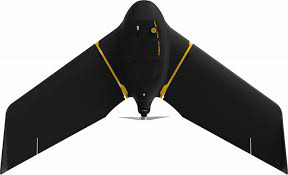

In [6]:
image = Image.open('/content/gdrive/MyDrive/EVA8_P1_S14/Val_Data/Winged Drones/wd7.jpg')
image

In [7]:
val_transforms = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor()
])
input_data = val_transforms(image).unsqueeze(0)
input_data.shape

torch.Size([1, 3, 512, 512])

In [8]:
embedding_layer = new_model.relu_extr
new_model.eval()
pattern = embedding_layer(input_data)
pattern = pattern.to(device)
print(f'pattern.shape : {pattern.shape}')

pattern.shape : torch.Size([1, 3, 512, 512])


# Huggingface

In [9]:
!pip install -q --upgrade transformers diffusers ftfy
!pip install -q accelerate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 72.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 934.9/934.9 kB 65.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 116.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 26.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 215.3/215.3 kB 7.9 MB/s eta 0:00:00


In [10]:
from base64 import b64encode

import numpy
import torch
from diffusers import AutoencoderKL, LMSDiscreteScheduler, UNet2DConditionModel
from huggingface_hub import notebook_login
import torch.nn as nn
import torch.nn.functional as F
import random
from tqdm import tqdm
import os

# For video display:
from IPython.display import HTML
from matplotlib import pyplot as plt
from pathlib import Path
from PIL import Image
from torch import autocast
from torchvision import transforms as tfms
from tqdm.auto import tqdm
from transformers import CLIPTextModel, CLIPTokenizer, logging

torch.manual_seed(1)
if not (Path.home()/'.huggingface'/'token').exists(): notebook_login()

# Supress some unnecessary warnings when loading the CLIPTextModel
logging.set_verbosity_error()

# Set device
torch_device = "cuda" if torch.cuda.is_available() else "cpu"

In [11]:
# Load the autoencoder model which will be used to decode the latents into image space. 
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")

# Load the tokenizer and text encoder to tokenize and encode the text. 
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")

# The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet")

# The noise scheduler
scheduler = LMSDiscreteScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000)

# To the GPU we go!
vae = vae.to(torch_device)
text_encoder = text_encoder.to(torch_device)
unet = unet.to(torch_device);

In [12]:
def pil_to_latent(input_im):
    # Single image -> single latent in a batch (so size 1, 4, 64, 64)
    with torch.no_grad():
        latent = vae.encode(tfms.ToTensor()(input_im).unsqueeze(0).to(torch_device)*2-1) # Note scaling
    return 0.18215 * latent.latent_dist.sample()  # [1, 4, 64, 64]

def latents_to_pil(latents):
    # bath of latents -> list of images
    latents = (1 / 0.18215) * latents
    with torch.no_grad():
        image = vae.decode(latents).sample
    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (image * 255).round().astype("uint8")
    pil_images = [Image.fromarray(image) for image in images]
    return pil_images

In [13]:
!cp '/content/gdrive/My Drive/EVA8_P1_S14/birb_embed.bin' '.'

In [14]:
birb_embed = torch.load('/content/birb_embed.bin')
birb_embed.keys(), birb_embed['<birb-style>'].shape

(dict_keys(['<birb-style>']), torch.Size([768]))

In [15]:
def blue_loss(images):
    print(type(images), images.shape)
    # How far are the red channel values to 0.9:
    error = torch.abs(images[:,2] - 0.9).mean() # [:,2] -> all images in batch, only the red channel
    return error

In [21]:
def pattern_loss(images, pattern):
    """
    This function calculates the pattern loss between the output image and the desired pattern.

    Parameters:
    images (torch.Tensor): The output image generated by the Huggingface model.
    pattern (torch.Tensor): The desired pattern that the output image should follow. This is extracted from a pre-trained model in above steps.

    Returns:
    torch.Tensor: The pattern loss between the output image and the desired pattern.
    """
    # Calculate the absolute difference between the model predicetd image and the pattern extracted from pre-trained model(above step).
    diff = torch.abs(images - pattern)
    # Sum the difference over all channels and pixels.
    loss = torch.sum(diff)
    return loss

In [26]:
prompt = 'A car' #@param
height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion
num_inference_steps = 500  #@param           # Number of denoising steps
guidance_scale = 8 #@param               # Scale for classifier-free guidance
generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise
batch_size = 1
blue_loss_scale = 200 #@param
pattern_loss_scale = 0.00005 #@param

# Make a folder to store results
!rm -rf steps/
!mkdir -p steps/

In [27]:
# Prep text 
text_input = tokenizer([prompt], padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]

# And the uncond. input as before:
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
with torch.no_grad():
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0] 
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

# Prep Scheduler
scheduler.set_timesteps(num_inference_steps)

# Prep latents
latents = torch.randn(
  (batch_size, unet.in_channels, height // 8, width // 8),
  generator=generator,
)
latents = latents.to(torch_device)
latents = latents * scheduler.init_noise_sigma

<ipython-input-27-59989f55d9eb>:20: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (batch_size, unet.in_channels, height // 8, width // 8),


0it [00:00, ?it/s]

0 loss: 18.19760513305664
10 loss: 15.149617195129395
20 loss: 15.517704010009766
30 loss: 12.036345481872559
40 loss: 11.945899963378906
50 loss: 12.311732292175293
60 loss: 12.161487579345703
70 loss: 11.394665718078613
80 loss: 10.519718170166016
90 loss: 9.558310508728027
100 loss: 9.26851749420166
110 loss: 8.885976791381836
120 loss: 8.589369773864746
130 loss: 8.60861587524414
140 loss: 8.375558853149414
150 loss: 8.317059516906738
160 loss: 8.206721305847168
170 loss: 8.064541816711426
180 loss: 7.9294233322143555
190 loss: 7.807222366333008
200 loss: 7.70070743560791
210 loss: 7.6095662117004395
220 loss: 7.517950534820557
230 loss: 7.440328121185303
240 loss: 7.381777763366699
250 loss: 7.334320068359375
260 loss: 7.296525001525879
270 loss: 7.269514083862305
280 loss: 7.24884033203125
290 loss: 7.223127841949463
300 loss: 7.185827732086182
310 loss: 7.167909145355225
320 loss: 7.153367042541504
330 loss: 7.141865253448486
340 loss: 7.132625579833984
350 loss: 7.1244521141052

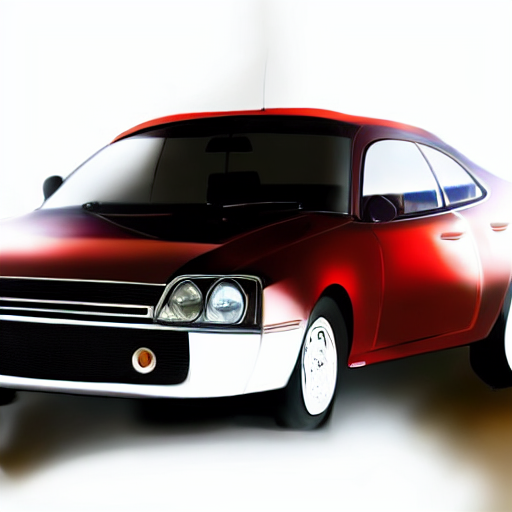

In [28]:
# Loop
for i, t in tqdm(enumerate(scheduler.timesteps)):
    # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
    latent_model_input = torch.cat([latents] * 2)
    sigma = scheduler.sigmas[i]
    latent_model_input = scheduler.scale_model_input(latent_model_input, t)

    # predict the noise residual
    with torch.no_grad():
        noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

    # perform CFG
    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)
    
    #### ADDITIONAL GUIDANCE ###
    if i%5 == 0:
        # Requires grad on the latents
        latents = latents.detach().requires_grad_()

        # Get the predicted x0:
        # latents_x0 = latents - sigma * noise_pred
        latents_x0 = scheduler.step(noise_pred, t, latents).pred_original_sample

        # Decode to image space
        denoised_images = vae.decode((1 / 0.18215) * latents_x0).sample / 2 + 0.5 # range (0, 1)        

        # Calculate loss
        #loss = blue_loss(denoised_images) * blue_loss_scale
        loss = pattern_loss(denoised_images, pattern) * pattern_loss_scale
        
        # Occasionally print it out
        if i%10==0:
            print(i, 'loss:', loss.item())

        # Get gradient
        cond_grad = torch.autograd.grad(loss, latents)[0]

        # Modify the latents based on this gradient
        latents = latents.detach() - cond_grad * sigma**2
    
    # Now step with scheduler
    latents = scheduler.step(noise_pred, t, latents).prev_sample

    # To PIL Images
    im_t0 = latents_to_pil(latents_x0)[0]
    im_next = latents_to_pil(latents)[0]

    # Combine the two images and save for later viewing
    im = Image.new('RGB', (1024, 512))
    im.paste(im_next, (0, 0))
    im.paste(im_t0, (512, 0))
    im.save(f'steps/{i:04}.jpeg')        

latents_to_pil(latents)[0]

In [29]:
# Make and show the progress video (change width to 1024 for full res)
!ffmpeg -v 1 -y -f image2 -framerate 12 -i steps/%04d.jpeg -c:v libx264 -preset slow -qp 18 -pix_fmt yuv420p out.mp4
mp4 = open('out.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)